In [71]:
import os
import sys
sys.path.insert(0,os.path.join('/project/venv/lib/python3.8/site-packages/'))
sys.path.insert(0,os.path.join('/venv/lib/python3.8/site-packages'))

def ignore_user_installs(username):
    ## avoid using user installs
    user_install_path = '/scratch/' + username + '/python/lib/python3.8/site-packages'
    if user_install_path in sys.path:
        sys.path.remove(user_install_path)

ignore_user_installs("starzew")

os.environ["CUDA_VISIBLE_DEVICES"] = "1"
os.environ['HTTP_PROXY'] = 'http://fp.cs.ovgu.de:3210/'
os.environ['HTTPS_PROXY'] = 'http://fp.cs.ovgu.de:3210/'


In [ ]:
import torch
import numpy as np
from matplotlib import pyplot as plt
from transformers import WhisperProcessor, WhisperForConditionalGeneration, AutoFeatureExtractor
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import dill
import seaborn as sns

/usr/local/jupyter/lib/python3.8/site-packages/requests/__init__.py:102: RequestsDependencyWarning: urllib3 (1.26.6) or chardet (5.2.0)/charset_normalizer (2.0.4) doesn't match a supported version!
  warnings.warn("urllib3 ({}) or chardet ({})/charset_normalizer ({}) doesn't match a supported "
2025-03-11 13:58:05.494281: I tensorflow/core/util/port.cc:110] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-03-11 13:58:05.545010: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F AVX512_VNNI FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [ ]:
from cka import CKA

In [5]:
if torch.cuda.is_available():
    print(f"Using GPU: {torch.cuda.get_device_name(0)}")
else:
    print("GPU is not available")

Using GPU: NVIDIA GeForce RTX 2080 Ti


# Whisper

In [ ]:
# Load model & Feature Extractor
model = WhisperForConditionalGeneration.from_pretrained("openai/whisper-base")
model_ft = WhisperForConditionalGeneration.from_pretrained("/project/thesis/model/base-ft")

processor = WhisperProcessor.from_pretrained("openai/whisper-base")
feature_extractor = AutoFeatureExtractor.from_pretrained("openai/whisper-base")
decoder_input_ids = torch.tensor([[1, 1]]) * model.config.decoder_start_token_id

In [5]:
for m in [model, model_ft]:
    m.generation_config.language = "english"
    m.generation_config.task = "transcribe"
    m.generation_config.is_multilingual = False
    m.generation_config.forced_decoder_ids = None

# Dataset

In [6]:
def load_pkl(file_name):
    with open(file_name, 'rb') as inp:
        data = dill.load(inp)
        
    return data

In [9]:
ds_crayon = load_pkl('datasets/crayon_merged.pkl')
ds_severities_merged = load_pkl('datasets/severities_merged_test.pkl')
ds_severities = load_pkl('datasets/severities.pkl')

In [7]:
ds_final = load_pkl("datasets/final.pkl")

# How to Calculate Embedding-Based Representations

**Variant 1**: Average over all frames -> time-averages - tavgs

**Variant 2**: Average over frames corresponding to sample -> frame-averages - favgs

In [ ]:
def hs_variance(hs, n_samples, num_frames, variant):
    v_ins = []
    v_outs = []
    for layer in range(7):
        v_in = []
        v_out = []

        for sample in range(n_samples):
            # for each sample in each layer: variance in frames up to num_frames/2 and variance in frames after
            if variant == "time":
                variance_in = hs[layer][sample][:int((num_frames[sample]-1)/2)].var(0) # -> shape = [512]
                variance_out = hs[layer][sample][int((num_frames[sample]-1)/2):].var(0)
                
                 # mean over hidden dim
                variance_in = torch.mean(variance_in) # -> shape = []
                variance_out = torch.mean(variance_out)                
            
            elif variant == "all":
                variance_in = hs[layer][sample][:int((num_frames[sample]-1)/2)].var() # -> shape = []
                variance_out = hs[layer][sample][int((num_frames[sample]-1)/2):].var()
                v_in.append(variance_in)
                v_out.append(variance_out)
            else:
                raise ValueError('Variant must be "time" or "all"')
            
            
            # if sample is cut to 30 secs, variance_out cannot be computed -> skip
            if not torch.isnan(variance_out):
                v_out.append(variance_out)
            v_in.append(variance_in)
                

        # mean over samples in a layer
        v_in = np.mean(np.array(v_in))
        v_out = np.mean(np.array(v_out))

        v_ins.append(v_in)
        v_outs.append(v_out)
        
    return v_ins, v_outs

In [ ]:
def inputs_variance(inputs, n_samples, num_frames, variant):
    v_in = []
    v_out = []
    for sample in range(n_samples):
        if variant == "time":
            # variance over time axis
            variance_in  = inputs[sample][:, :int(num_frames[sample]-1)].var(1) # -> shape = [80]
            variance_out = inputs[sample][:, int(num_frames[sample]-1):].var(1)
            
            # mean over feature dim
            variance_in = torch.mean(variance_in)
            variance_out = torch.mean(variance_out)
        
        elif variant == "all":
            # variance over time axis & feature dim
            variance_in  = inputs[sample][:, :int(num_frames[sample]-1)].var() # -> shape = []
            variance_out = inputs[sample][:, int(num_frames[sample]-1):].var() 
        else:
            raise ValueError('Variant must be "time" or "all"') 
        
        
        # if sample is cut to 30 secs, variance_out cannot be computed -> skip
        if not torch.isnan(variance_out):
            v_out.append(variance_out)
        v_in.append(variance_in)
        
    # average over samples
    v_in = np.mean(np.array(v_in))
    v_out = np.mean(np.array(v_out))
        
    return v_in, v_out

In [244]:
# create random subset of samples
n_samples = 1000
indices = np.random.randint(len(ds_severities['all']),size=n_samples)
subset = [ds_severities['all'][i] for i in indices]
targets = [ds_severities['transcripts_all'][i] for i in indices]

In [245]:
# extract features
inputs = feature_extractor(subset, return_token_timestamps=True, do_normalize=True,sampling_rate=16000,return_tensors="pt")
num_frames = inputs.num_frames
inputs = inputs.input_features

# set values >3000 to 3000, longer samples will be cut to this length
num_frames = torch.where(num_frames <= 3000, num_frames, 3000)

In [249]:
# Calc variance for mel spectogram features: v_in - variance of frames corresponding to sample, v_out - variance of frames corresponding to padding
v_in_t, v_out_t = inputs_variance(inputs, n_samples, num_frames, "time")
v_in_all, v_out_all = inputs_variance(inputs, n_samples, num_frames, "all")

print(v_in_t, v_out_t)
print(v_in_all, v_out_all)

0.124655195 0.0002040203
0.15623847 0.00020398077


For mel spectogram features:
- variance in frames corresponding to sample signficantly higher
- same trend for both variants (var over both dims or over time dim)

In [251]:
# predit inputs -> hidden states
with torch.no_grad():
    preds = model(inputs, decoder_input_ids=decoder_input_ids, output_hidden_states=True)
hs = preds.encoder_hidden_states

Passing a tuple of `past_key_values` is deprecated and will be removed in Transformers v4.43.0. You should pass an instance of `EncoderDecoderCache` instead, e.g. `past_key_values=EncoderDecoderCache.from_legacy_cache(past_key_values)`.


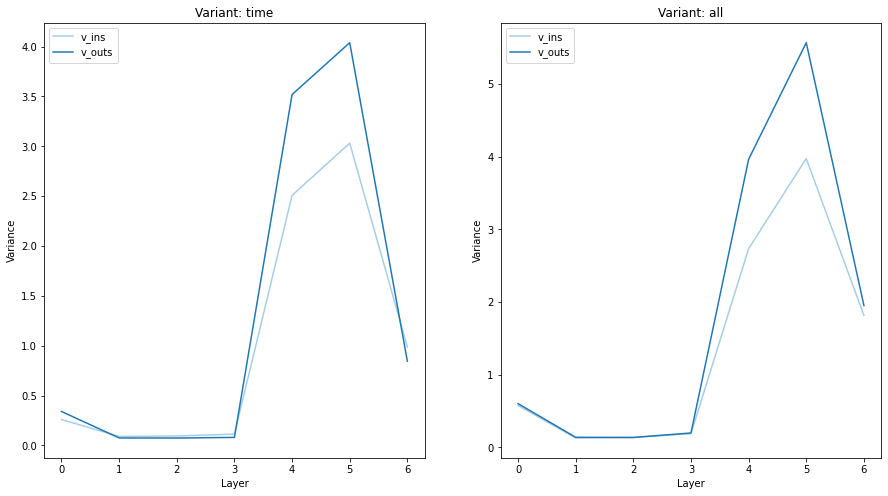

In [256]:
v_ins = dict()
v_outs = dict()
variants = ["time", "all"]

for variant in variants:
    v_ins[variant], v_outs[variant] = hs_variance(hs, n_samples, num_frames, variant)

plt.figure(figsize=(15,8))

for i, variant in enumerate(variants):
    plt.subplot(1,2,i+1)
    plt.plot(v_ins[variant], label="v_ins")
    plt.plot(v_outs[variant], label="v_outs")
    plt.xlabel("Layer")
    plt.ylabel("Variance")
    plt.title(f"Variant: {variant}")
    plt.legend()
plt.show()

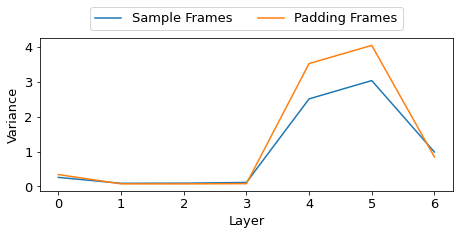

In [271]:
px = 1/plt.rcParams['figure.dpi']  # pixel in inches
plt.rcParams["axes.prop_cycle"] = plt.cycler("color", plt.cm.tab10.colors)
fig = plt.figure()
fig.set_figwidth(480*px)
fig.set_figheight(3.5)
fs = 13
plt.plot(v_ins["time"], label="Sample Frames")
plt.plot(v_outs["time"], label="Padding Frames")
plt.xlabel("Layer", fontsize=fs)
plt.xticks(fontsize=fs)
plt.ylabel("Variance", fontsize=fs)
plt.yticks(fontsize=fs)
plt.legend(fontsize=fs,loc='upper center', bbox_to_anchor=(0.5, 1.25), ncols=2)
plt.tight_layout()
plt.savefig("figs/variance.pdf")
plt.show()

For encoder hidden states:
- variance in frames corresponding to sample is significantly lower beginning with layer 3
- that means that all frames are used for computation
- why higher and not same variance ? frames corresponding to samples are strictly less than padding frames
- the higher the layer the higher the variance

**=> We should use the time-average approach to calculate word representations**

# Data Split

In [10]:
# get time-averaged representations of hidden_states of all given samples
def get_time_avg_representations(encoder_hidden_states):
    avgs = []
    for hidden_state in encoder_hidden_states:
        avgs.append(torch.mean(hidden_state, dim=1)) # average representation over time-axis: [n_samples,1500,512] -> [n_samples,512]

    return avgs

# get time-averaged representations of hidden_states averaged over samples of severity
def get_severity_avg_representations(time_avg_representations,n_samples_per_severity):
    avg_very_low = []
    avg_low = []
    avg_middle = []
    avg_high = []
    for representations in time_avg_representations: # go through each layer, representations.shape = [n_samples_per_severityx4, 512]
        avg_very_low.append(torch.mean(representations[:n_samples_per_severity], dim=0)) # shape = [512]
        avg_low.append(torch.mean(representations[n_samples_per_severity:2*n_samples_per_severity], dim=0))
        avg_middle.append(torch.mean(representations[2*n_samples_per_severity:3*n_samples_per_severity], dim=0))
        avg_high.append(torch.mean(representations[:3*n_samples_per_severity], dim=0))
    return avg_very_low, avg_low, avg_middle, avg_high


# avg the representations over samples
def get_avg_representations(time_avg_representations):
    avgs = []
    for representations in time_avg_representations:
         avgs.append(torch.mean(representations, dim=0))
    
    return avgs


# layer-wise distance/similarity of representation for representations in shape [n_samples x n_severities, 512]
def distances_representations(representations_per_layer):
    distances = []  # layer-wise distances to representation of intelligibility "high"
    cosine_sims = [] # layer-wise cosine similarities to representation of intelligibility "high"

    for representations in representations_per_layer: #representation.shape = [40,512]
        cosine = []
        distance = []
        for sample in representations:
            cosine.append(torch.nn.functional.cosine_similarity(sample, representations[-1], dim=0).detach().numpy()) # representations[-1] - embedding of sample with intelligibility "high"
            distance.append(torch.nn.functional.mse_loss(sample, representations[-1]).detach().numpy())
        cosine_sims.append(cosine)
        distances.append(distance)
    
    return cosine_sims, distances
 

        
        
# layerwise, pairwise distance/similarity of representations 
def cosines_pairwise(representations_per_layer1, representations_per_layer2):
    cosine_sims = [] # layer-wise cosine similarities 
    
    for i in range(len(representations_per_layer1)): # go through each layer
        cosine = []
        #print(representations_per_layer_pt[i].shape) [100,512]
        for j in range(len(representations_per_layer1[i])): # go through each sample in rep1
            for k in range(len(representations_per_layer2[i])): # go through each sample in rep2
                cosine.append(torch.nn.functional.cosine_similarity(representations_per_layer1[i][j], representations_per_layer2[i][k], dim=0).detach().numpy()) 
        cosine_sims.append(np.mean(cosine)) # avg over pairwise sims in one layer
        
    return cosine_sims

# layer-wise dist / sim of average representations for severity - high
def distances_of_avgs(avg_very_low, avg_low, avg_middle, avg_high):
    distances = []  # layer-wise distances to representation of intelligibility "high"
    cosine_sims = [] # layer-wise cosine similarities to representation of intelligibility "high"

    # n_layers x [512]
    for i in range(len(avg_very_low)): # go through each layer
        cosine = []
        distance = []
        #print(avg_high[i].shape)
        for avgs in [avg_very_low, avg_low, avg_middle, avg_high]:# go through each severity
            cosine.append(torch.nn.functional.cosine_similarity(avg_high[i], avgs[i], dim=0).detach().numpy())
            distance.append(torch.nn.functional.mse_loss(avg_high[i], avgs[i]).detach().numpy())

        cosine_sims.append(cosine)
        distances.append(distance)

    return cosine_sims, distances

In [14]:
def cka_matrix(embeds1, embeds2):
    # embeds shape layer x [n_samples, hidden_dim] -> cka is not calculated for single examples
    n = len(embeds1)
    result = np.zeros((n,n))
    
    for layer1 in range(n):
        for layer2 in range(n):
            result[layer1,layer2] = CKA.linear_CKA(embeds1[layer1], embeds2[layer2])
    
    return result

    

### Comparison of Representations PT&FT for all Words at Different Severities

cca, scca & pwcca code taken from blog https://github.com/google/svcca/blob/master/tutorials/001_Introduction.ipynb

In [9]:
def plot_sims(sims, severities, title):
    plt.figure(figsize=(15,10))
    
    y = ["Cosine", "CKA", "PWCCA", "SVCCA"]

    for i,sim in enumerate(sims):
        plt.subplot(2,2,i+1)
        for sev in severities:
            plt.plot(np.diagonal(sim[sev]), label=sev)
            #plt.plot(np.diagonal(sim[f"{sev}_b"]), label=f"{sev}_baseline")


        plt.xlabel("Layer", fontsize=15)
        plt.ylabel(y[i], fontsize=15)
        plt.xticks(fontsize=15)
        plt.yticks(fontsize=15)
        #plt.yscale("log")
        plt.legend(fontsize=15)




    plt.suptitle(title, fontsize=18)
    plt.tight_layout()
    plt.show()

def plot_sims_b(sims, severities, title):
    plt.figure(figsize=(15,10))
    
    y = ["Cosine", "CKA", "PWCCA", "SVCCA"]

    for i,sim in enumerate(sims):
        plt.subplot(2,2,i+1)
        for sev in severities:
            plt.plot(np.diagonal(sim[sev]), label=sev)
            plt.plot(np.diagonal(sim[f"{sev}_b"]), label=f"{sev}_baseline")


        plt.xlabel("Layer", fontsize=15)
        plt.ylabel(y[i], fontsize=15)
        plt.xticks(fontsize=15)
        plt.yticks(fontsize=15)
        #plt.yscale("log")
        plt.legend(fontsize=15)




    plt.suptitle(title, fontsize=18)
    plt.tight_layout()
    plt.show()

def plot_diffs(sims, severities, abs_rel, title):
    plt.figure(figsize=(15,10))
    
    y = ["Diff Cosine PT-FT", "Diff CKA PT-FT", "Diff PWCCA PT-FT", "Diff SVCCA PT-FT"]

    for i,sim in enumerate(sims):
        plt.subplot(2,2,i+1)
        for sev in severities:
            if abs_rel == "abs":
                plt.plot(np.diagonal(sim[f"{sev}_b"])-np.diagonal(sim[sev]), label=sev)
            if abs_rel =="rel":
                plt.plot(np.diagonal(sim[sev])/np.diagonal(sim[f"{sev}_b"]), label=sev)

        plt.xlabel("Layer", fontsize=15)
        plt.ylabel(y[i], fontsize=15)
        plt.xticks(fontsize=15)
        plt.yticks(fontsize=15)
        #plt.yscale("log")
        plt.legend(fontsize=15)




    plt.suptitle(title, fontsize=18)
    plt.tight_layout()
    plt.show()
    
def plot_diffs_blocks(sims1,sims2, severities, abs_rel, title):
    plt.figure(figsize=(15,10))
    
    y = ["Diff Cosine PT-FT", "Diff CKA PT-FT", "Diff PWCCA PT-FT", "Diff SVCCA PT-FT"]

    for i,sim in enumerate(sims1):
        plt.subplot(2,2,i+1)
        for sev in severities:
            if abs_rel == "abs":
                plt.plot(np.diagonal(sim[f"{sev}"])-np.diagonal(sims2[i][sev]), label=sev)
            if abs_rel =="rel":
                plt.plot(np.diagonal(sim[sev])/np.diagonal(sims2[i][f"{sev}"]), label=sev)

        plt.xlabel("Layer", fontsize=15)
        plt.ylabel(y[i], fontsize=15)
        plt.xticks(fontsize=15)
        plt.yticks(fontsize=15)
        #plt.yscale("log")
        plt.legend(fontsize=15)




    plt.suptitle(title, fontsize=18)
    plt.tight_layout()
    plt.show()

In [73]:
cos_dict = dict()
cka_dict = dict()
pwcca_dict = dict()
svcca_dict = dict()

for block in ["B1", "B2", "B1B2","B3"]:
    cos_dict[block] = load_pkl(f'sims/cosines_tavg_ptft_{block}.pkl')
    cka_dict[block] = load_pkl(f'sims/ckas_tavg_ptft_{block}.pkl')
    pwcca_dict[block] = load_pkl(f'sims/pwccas_tavg_ptft_{block}.pkl')
    svcca_dict[block] = load_pkl(f'sims/svccas_tavg_ptft_{block}.pkl')

In [74]:
cosines = load_pkl('sims/cosines_tavg_ptft.pkl')
ckas = load_pkl('sims/ckas_tavg_ptft.pkl')
pwccas = load_pkl('sims/pwccas_tavg_ptft.pkl')
svccas = load_pkl('sims/svccas_tavg_ptft.pkl')

cosines_att = load_pkl('sims/cosines_attentions_ptft.pkl')
ckas_att = load_pkl('sims/ckas_attentions_ptft.pkl')
pwccas_att = load_pkl('sims/pwccas_attentions_ptft.pkl')
svccas_att = load_pkl('sims/svccas_attentions_ptft.pkl')

In [75]:
cosines_c = load_pkl('sims/cosines_tavg_c_pt.pkl')
ckas_c = load_pkl('sims/ckas_tavg_c_pt.pkl')
pwccas_c = load_pkl('sims/pwccas_tavg_c_pt.pkl')
svccas_c = load_pkl('sims/svccas_tavg_c_pt.pkl')

cosines_c_att = load_pkl('sims/cosines_attentions_c_pt.pkl')
ckas_c_att = load_pkl('sims/ckas_attentions_c_pt.pkl')
pwccas_c_att = load_pkl('sims/pwccas_attentions_c_pt.pkl')
svccas_c_att = load_pkl('sims/svccas_attentions_c_pt.pkl')

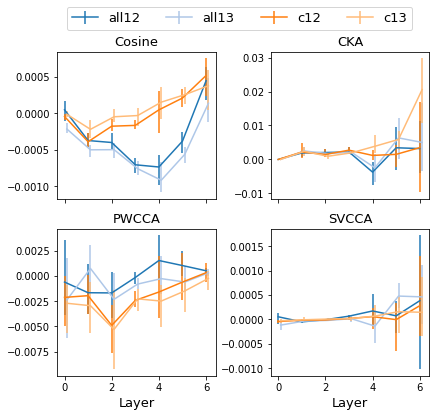

In [ ]:
px = 1/plt.rcParams['figure.dpi']  # pixel in inches
fig, ax = plt.subplots(nrows=2, ncols=2, sharex=True)
ax = np.ndarray.flatten(ax)
fig.set_figwidth(480*px)
fig.set_figheight(6)
fs = 13
    
y = ["Cosine", "CKA", "PWCCA", "SVCCA"]
#sevs = ["v_l","l","m","h","all","c"]
sevs = ["all","c"]
sims = [cos_dict, cka_dict, svcca_dict, pwcca_dict]
plt.rcParams["axes.prop_cycle"] = plt.cycler("color", plt.cm.tab20.colors)



for i,sim in enumerate(sims):
    #plt.subplot(4,1,i+1, sharex=True)
    for sev in sevs:
        values1 = []
        values2 = []
        values3 = []
        for subset in range(10):
            values1.append(np.diagonal(sim["B1"][f"{sev}_{subset}"]))
            values2.append(np.diagonal(sim["B2"][f"{sev}_{subset}"]))
            values3.append(np.diagonal(sim["B3"][f"{sev}_{subset}"]))
        
        values1 = np.array(values1)
        values2 = np.array(values2)
        values3 = np.array(values3)
        
        diff12 = values1-values2
        diff13 = values1-values3
        
        diff12mean = np.mean(diff12, axis=0)
        diff13mean = np.mean(diff13, axis=0)
        
        
        diff12xerr = []
        diff13xerr = []
        for j in range(7):
            diff12xerr.append([diff12[:,j].min()-diff12mean[j], diff12[:,j].max()-diff12mean[j]])
            diff13xerr.append([diff13[:,j].min()-diff13mean[j], diff13[:,j].max()-diff13mean[j]])
            
        diff12xerr = np.abs(np.transpose(np.array(diff12xerr)))
        diff13xerr = np.abs(np.transpose(np.array(diff13xerr)))
        
       
        x = np.array(list(range(7)))
        
        
        ax[i].errorbar(x, diff12mean, diff12xerr, label=f"{sev}12")
        ax[i].errorbar(x+0.1, diff13mean, diff13xerr, label=f"{sev}13")


    plt.xlabel("Layer", fontsize=fs)
    ax[i].set_title(y[i], fontsize=fs)
    ax[i].tick_params(axis='both', which='major', labelsize=10)

    if i == 0:
        ax[i].legend(fontsize=fs,loc='upper center', bbox_to_anchor=(1.15, 1.35), ncols=4)
        
    if i == 2:
        ax[i].set_xlabel("Layer", fontsize=fs)

title = "Comparison of results between Blocks 1-2, and Blocks 1-3"
#plt.suptitle(title, fontsize=18)
fig.align_labels()
plt.subplots_adjust(bottom=0.1,top=0.85,wspace=0.35)

#fig.tight_layout()
plt.savefig("figs/datasplit.pdf")
plt.show()

## Low-dimensional visualization of embeddings for word "crayon" with different severities

In [13]:
def low_dim_scatter(pca_layerwise, labels,  suptitle):
    fig = plt.figure(figsize=(15,10))

    for i in range(len(pca_layerwise)):
        plt.subplot(2,4,i+1)

        scatter = plt.scatter(pca_layerwise[i][:,0],pca_layerwise[i][:,1],  c=labels, cmap='plasma')
        plt.xlabel("x1", fontsize=10)
        plt.ylabel("x2", fontsize=10)
        plt.title(f"Layer {i}")

    #plt.legend(label_encoder.inverse_transform(list(scatter.legend_elements())))
    plt.suptitle(suptitle)
    plt.tight_layout()
    plt.show()

In [12]:
def low_dim_scatter2(pca_layerwise, labels, legend,  suptitle):
    fig = plt.figure(figsize=(15,30))

    for i in range(len(pca_layerwise)):
        plt.subplot(4,2,i+1)

        scatter = sns.scatterplot(x=pca_layerwise[i][:,0],y=pca_layerwise[i][:,1], legend=legend, hue=labels)
        plt.xlabel("x1", fontsize=13)
        plt.ylabel("x2", fontsize=13)
        plt.title(f"Layer {i}")

    #plt.legend(label_encoder.inverse_transform(list(scatter.legend_elements())))
    plt.suptitle(suptitle, fontsize=15)
    plt.tight_layout()
    plt.show()

In [10]:
def layerwise_tsne(n_components, layerwise_data):
    n_components= 2
    tsne = TSNE(n_components)
    tsne_layerwise = []
    for data in layerwise_data:
        tsne_layerwise.append(tsne.fit_transform(data))

    return tsne_layerwise

def layerwise_psa(n_components, layerwise_data):
    n_components= 2
    pca = PCA(n_components=2)
    pca_layerwise = []
    for data in layerwise_data:
        pca_layerwise.append(pca.fit_transform(data))

    return pca_layerwise

In [ ]:
with open('tavg/crayon_all_pt.pkl', 'rb') as inp:
    tavg_crayon_all = dill.load(inp)
with open('tavg/crayon_all_ft.pkl', 'rb') as inp:
    tavg_crayon_all_ft = dill.load(inp)

# PCA
pca_layerwise_crayon = layerwise_psa(2, tavg_crayon_all )
pca_layerwise_crayon_ft = layerwise_psa(2, tavg_crayon_all_ft )
# TSNE
tsne_layerwise_crayon = layerwise_tsne(2, tavg_crayon_all)
tsne_layerwise_crayon_ft = layerwise_tsne(2, tavg_crayon_all_ft)

In [ ]:
intelligebilities = np.repeat([0,1,2,3], [12,14,20,14]) # labels (intelligebility level) for ds_crayon_all
speakers = {'F05':1, 'F03':2, 'M07':3,'F04':4, 'M11':5, 'M04':6, 'F02':7, 'M09':8, 'M05':9}

## Low-dimensional visualization of embeddings for all words with same severity

In [8]:
def tsne_severities(tavgs):
    n_components = 2
    
    tsnes = dict()
    
    for key in tavgs:
        print(key)
        tsnes[key] = layerwise_tsne(n_components, tavgs[key])
    
    return tsnes
    

In [ ]:
sevs = ["v_l","l","m","h","all","c"]
tavgs_pt = dict()
tavgs_ft = dict()
    
for sev in sevs:
    tavgs_pt[f"{sev}"] = load_pkl(f'tavg/final_{sev}_pt.pkl')
    tavgs_ft[f"{sev}"] = load_pkl(f'tavg/final_{sev}_ft.pkl')
    
tsne_pt = tsne_severities(tavgs_pt)
tsne_ft = tsne_severities(tavgs_ft)

v_l
l
m
h
all
c
v_l
l
m
h
all
c


In [17]:
ds = load_pkl(f'datasets/final.pkl')

In [69]:
def one_scatter(pca, labels, legend, title):
    fs=13
    fig, ax  = plt.subplots(1,3)
    px = 1/plt.rcParams['figure.dpi']  # pixel in inches
    fig.set_figwidth(800*px)
    tasks = ["Words", "Speakers", "Severities"]
    
    for i in range(3):
        scatter = sns.scatterplot(x=pca[i][:,0],y=pca[i][:,1], legend=legend, hue=labels[i], ax=ax[i])
        ax[i].set_title(tasks[i], fontsize=fs+2)
    
    for a in ax:
        a.tick_params(which="both", bottom=False,top=False,labelbottom=False,left=False,labelleft=False)
        a.set_box_aspect(1)
    #plt.title(title, fontsize=13)
    #plt.legend(labels,legend, fontsize=13)
    #plt.axis("off")
    plt.tight_layout()
    plt.savefig("figs/tsne.pdf")
    plt.show()

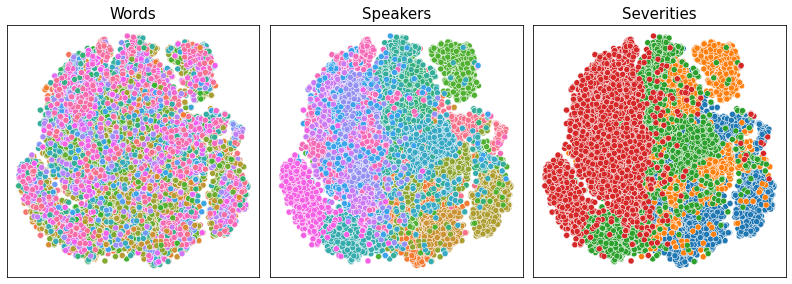

In [70]:
labels3 = np.concatenate([np.repeat("v_l",tavgs_pt["v_l"].shape[1]),np.repeat("l",tavgs_pt["l"].shape[1]),np.repeat("m",tavgs_pt["m"].shape[1]),np.repeat("h",tavgs_pt["h"].shape[1])])
labels2 = ds_final["speakers_all"]
labels1 = ds_final["transcripts_all"]
labels = [labels1,labels2,labels3]
data = [tsne_pt["all"][3],tsne_pt["all"][3],tsne_pt["all"][3]]
one_scatter(data,labels ,False, "Label: Severities, Model: PT, Layer: 3")

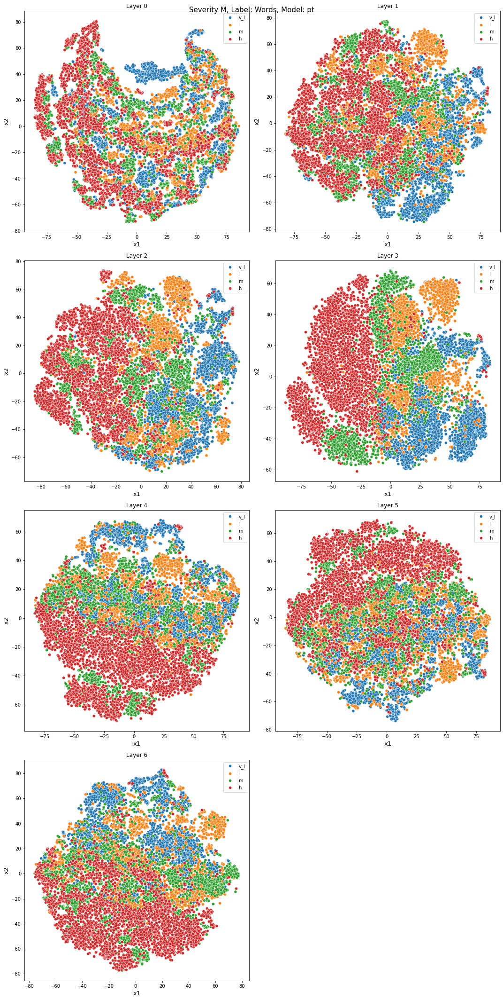

In [27]:
labels = np.concatenate([np.repeat("v_l",tavgs_pt["v_l"].shape[1]),np.repeat("l",tavgs_pt["l"].shape[1]),np.repeat("m",tavgs_pt["m"].shape[1]),np.repeat("h",tavgs_pt["h"].shape[1])])
low_dim_scatter2(tsne_pt["all"], labels, legend=True, suptitle="Severity M, Label: Words, Model: pt")

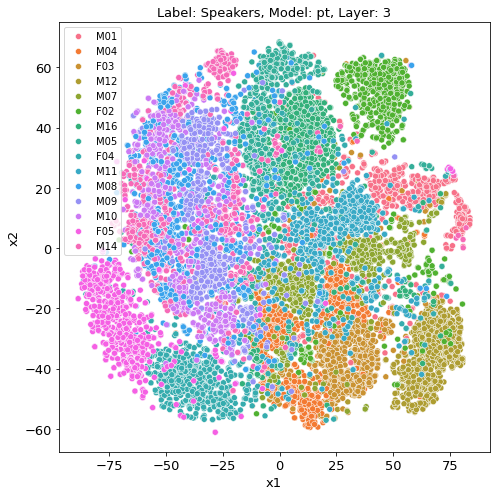

In [53]:
labels = ds["speakers_all"]
one_scatter(tsne_pt["all"][3], labels, "Label: Speakers, Model: pt, Layer: 3")

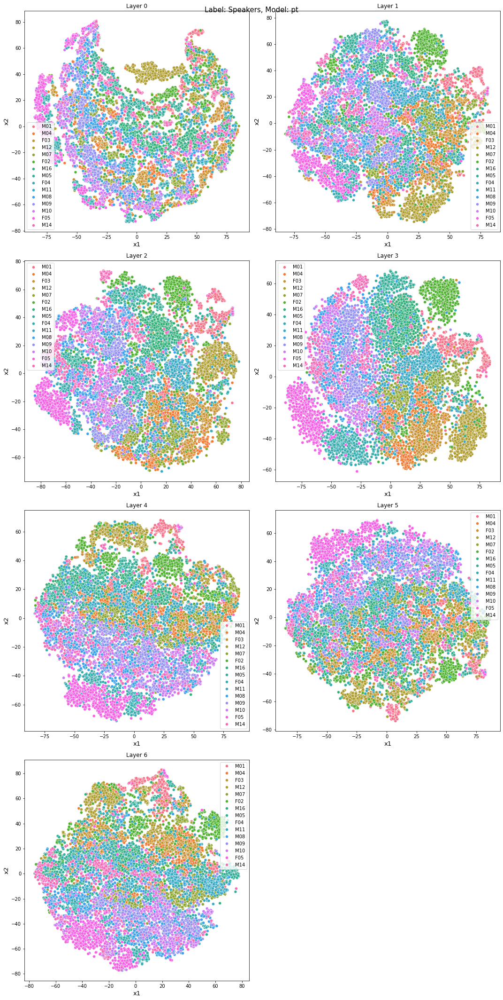

In [48]:
labels = ds["speakers_all"]
low_dim_scatter2(tsne_pt["all"], labels, legend=True, suptitle="Label: Speakers, Model: pt")

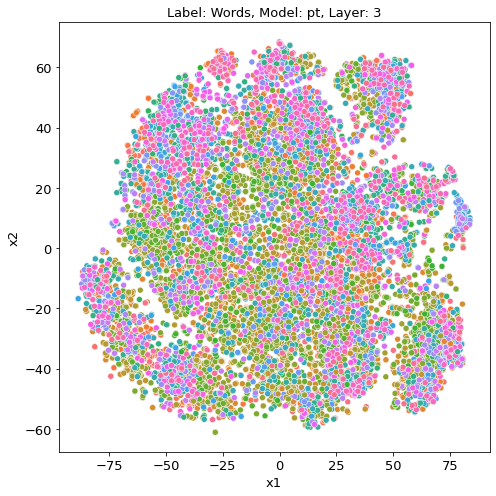

In [57]:
labels = ds["transcripts_all"]
one_scatter(tsne_pt["all"][3], labels, legend=False, title="Label: Words, Model: pt, Layer: 3")

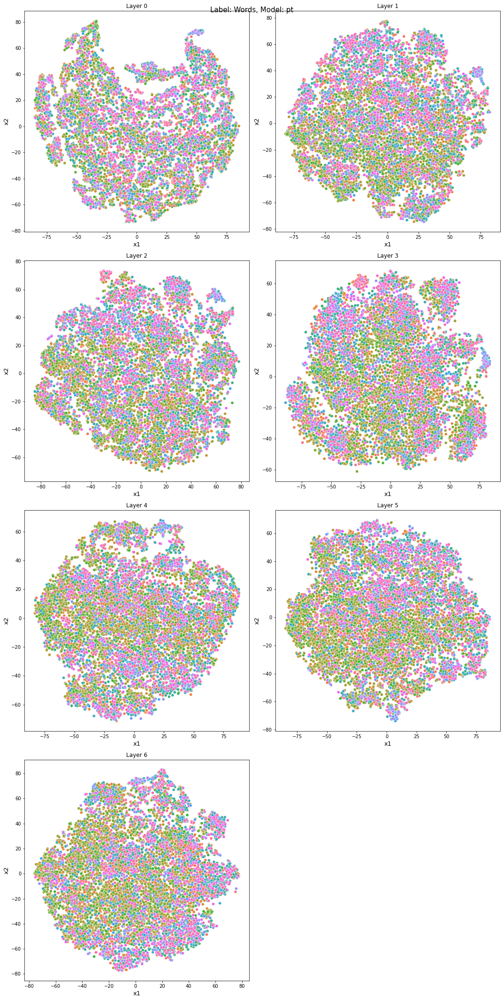

In [46]:
labels = ds["transcripts_all"]
low_dim_scatter2(tsne_pt["all"], labels, legend=False, suptitle="Label: Words, Model: pt")

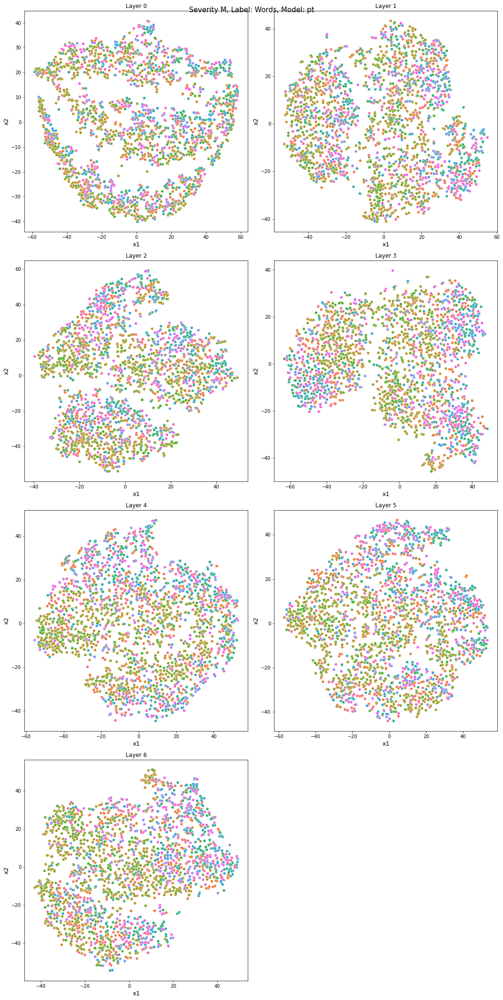

In [40]:
labels = ds["transcripts_m"]
low_dim_scatter2(tsne_pt["m"], labels, legend=False, suptitle= "Severity M, Label: Words, Model: pt")

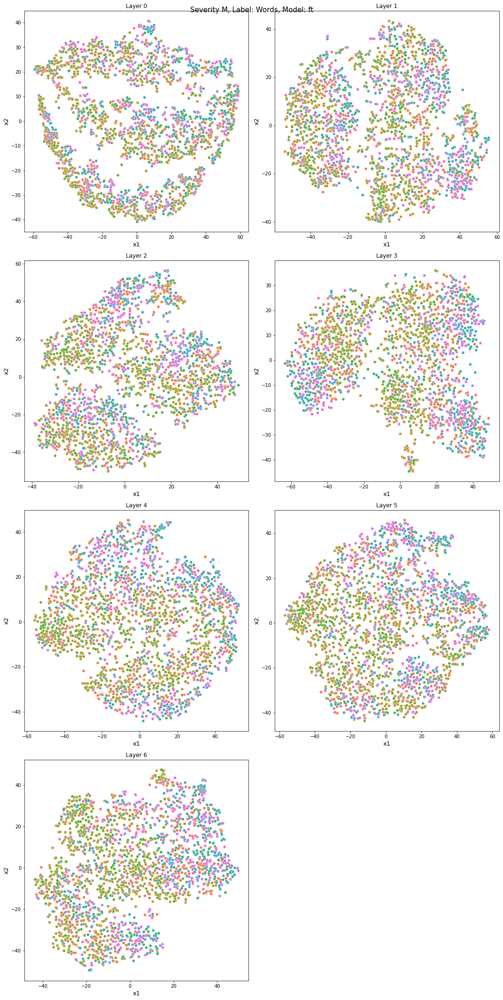

In [42]:
labels = ds["transcripts_m"]
low_dim_scatter2(tsne_ft["m"], labels, legend=False, suptitle="Severity M, Label: Words, Model: ft")

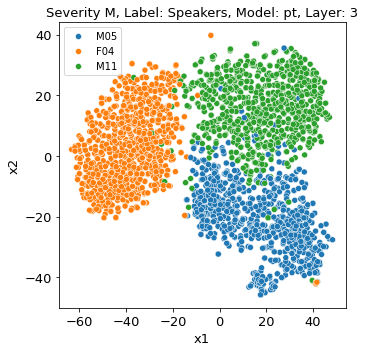

In [45]:
one_scatter(tsne_pt["m"][3], labels, "Severity M, Label: Speakers, Model: pt, Layer: 3")

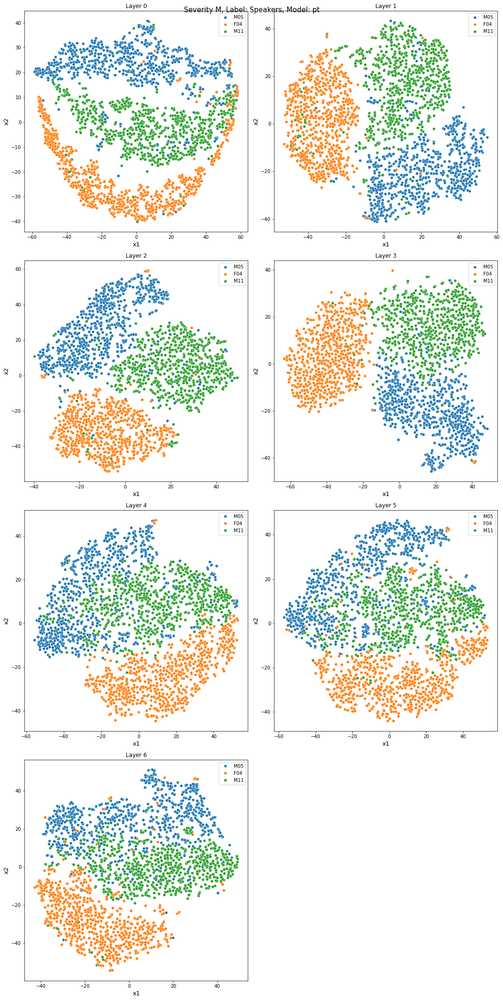

In [44]:
labels = ds["speakers_m"]
low_dim_scatter2(tsne_pt["m"], labels, legend=True, suptitle="Severity M, Label: Speakers, Model: pt")

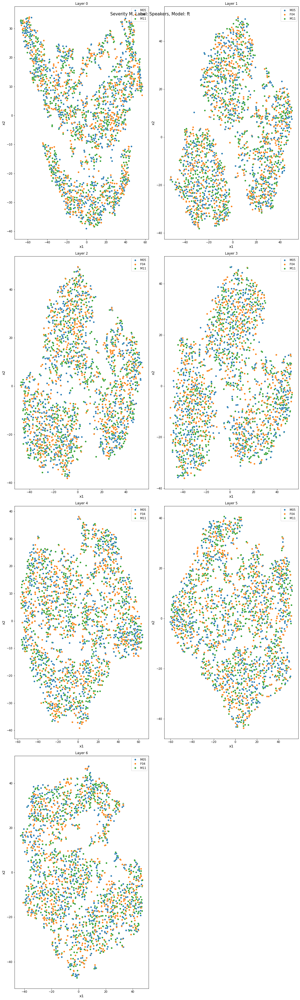

In [146]:
labels = ds["speakers_m"]
low_dim_scatter2(tsne_ft["m_ft"], labels[:-1], legend=True, suptitle="Severity M, Label: Speakers, Model: ft")